Let's use a registered, but unmatched science image. Steps to do it:

1. copy Meredith's HiTS data, esp. for two particular visits:
```
mkdir -p HiTS_from_Meredith/processed_15A38; cd HiTS_from_Meredith/processed_15A38
lsstdevget /project/mrawls/prototype_ap/processed_15A38/0410927
lsstdevget /project/mrawls/prototype_ap/processed_15A38/0411033
cd ..
lsstdevget /project/mrawls/prototype_ap/diffim_config.py
```
3. setup `lsst_apps` and then `obs_decam` (`obs_decam` is in stack now)
4. setup `pipe_tasks` to edit:
```
git clone https://github.com/lsst/pipe_tasks; cd pipe_tasks
setup -r . -t b2803
```
4. add `templateExposure.writeFits('WARPEDTEMPLATE.fits')` at line 350 of `ip_diffim/python/ip/diffim/imagePsfMatch.py`
5. then `scons` in `pipe_tasks` and `ip_diffim`
6. cd back to `HiTS_from_Meredith`
7. remove the existing directory: `rm -r diffim_15A38_g/`
7. run `imageDifference.py`
```
$PIPE_TASKS_DIR/bin/imageDifference.py processed_15A38 --id visit=411033 ccdnum=1..3 --templateId visit=410927 --output diffim_15A38_g -C diffim_config.py --no-versions
```
8. Then in order to run the ZogyTask code below, need to set up version of `ip_diffim` with `ZogyTask`:
```
git clone https://github.com/lsst/ip_diffim; cd ip_diffim
git checkout tickets/DM-8145
setup -r . -t b2803
scons
```

In [1]:
%load_ext autoreload
%autoreload 2

## borrowed from ../notebooks/17....ipynb...

import numpy as np
%matplotlib inline
from matplotlib import pyplot as plt

#  LSST imports:
import lsst.afw.image as afw_image
from lsst.afw.table import (SourceTable, SourceCatalog)
from lsst.meas.base import SingleFrameMeasurementConfig
from lsst.meas.algorithms import (SourceDetectionConfig, SourceDetectionTask)

import diffimTests as dit

No module named psfex.psfexPsfDeterminer


In [2]:
import os
import sys
import lsst.utils
import lsst.afw.geom as afwGeom
import lsst.afw.image as afwImage
import lsst.afw.math as afwMath
import lsst.meas.algorithms as measAlg
import lsst.ip.diffim as ipDiffim
import lsst.ip.diffim.diffimTools as diffimTools

display = False
print ipDiffim.__path__

['/Users/dreiss/GIT_REPOS/TICKETS/DM-9989/ip_diffim/python/lsst/ip/diffim']


In [48]:
# dont bother with CCD 1, the template doesn't have a PSF.
template = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/WARPEDTEMPLATE.fits')
science = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/processed_15A38/0411033/calexp/calexp-0411033_03.fits')
template_unwarped = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/processed_15A38/0410927/calexp/calexp-0410927_03.fits')

In [4]:
import diffimTests as dit
reload(dit);

In [5]:
def ga(exposure):
    return exposure.getMaskedImage().getImage().getArray()
def gv(exposure):
    return exposure.getMaskedImage().getVariance().getArray()
def gm(exposure):
    return exposure.getMaskedImage().getMask().getArray()

In [50]:
print dit.computeClippedImageStats(ga(template))
print dit.computeClippedImageStats(gv(template))
print dit.computeClippedImageStats(ga(science))
print dit.computeClippedImageStats(gv(science))
print dit.computeClippedImageStats(ga(template_unwarped))
print dit.computeClippedImageStats(gv(template_unwarped))

#ga(template)[:, :] -= dit.computeClippedImageStats(ga(template)).mean
#ga(science)[:, :] -= dit.computeClippedImageStats(ga(science)).mean
#print dit.computeClippedImageStats(ga(template))
#print dit.computeClippedImageStats(ga(science))

stats(mean=-5.739426e-05, stdev=4.9951644, min=-92.567528, max=36800.723)
stats(mean=49.899776, stdev=5.5475841, min=34.271389, max=8497.6777)
stats(mean=8.3380307e-08, stdev=5.2986126, min=-132.39868, max=38917.207)
stats(mean=60.944862, stdev=1.693751, min=33.64093, max=9981.7324)
stats(mean=0.17763451, stdev=5.4353433, min=-105.46145, max=36738.988)
stats(mean=62.135914, stdev=1.7246594, min=33.825768, max=9672.9736)


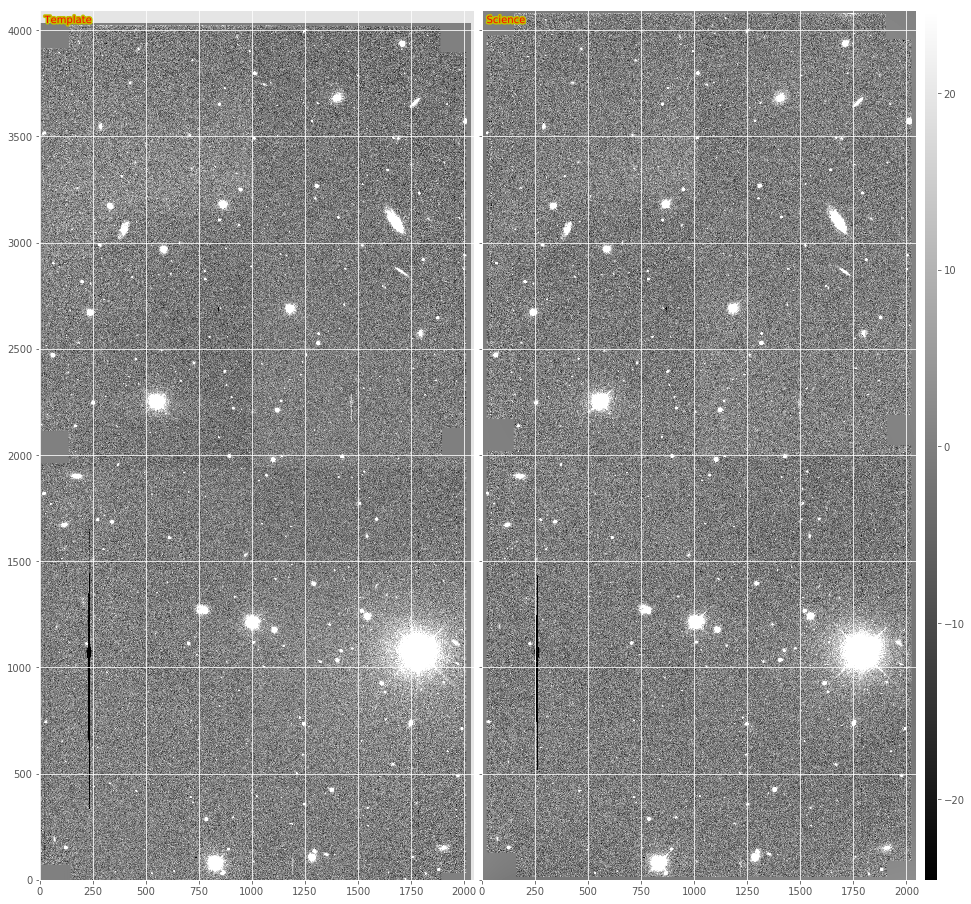

In [51]:
dit.plotImageGrid((ga(template), ga(science)), imScale=16, titles=['Template', 'Science'])

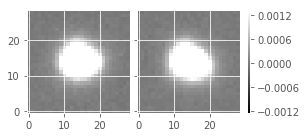

In [52]:
dit.plotImageGrid((science.getPsf().computeKernelImage().getArray(),
                   template.getPsf().computeKernelImage().getArray()))

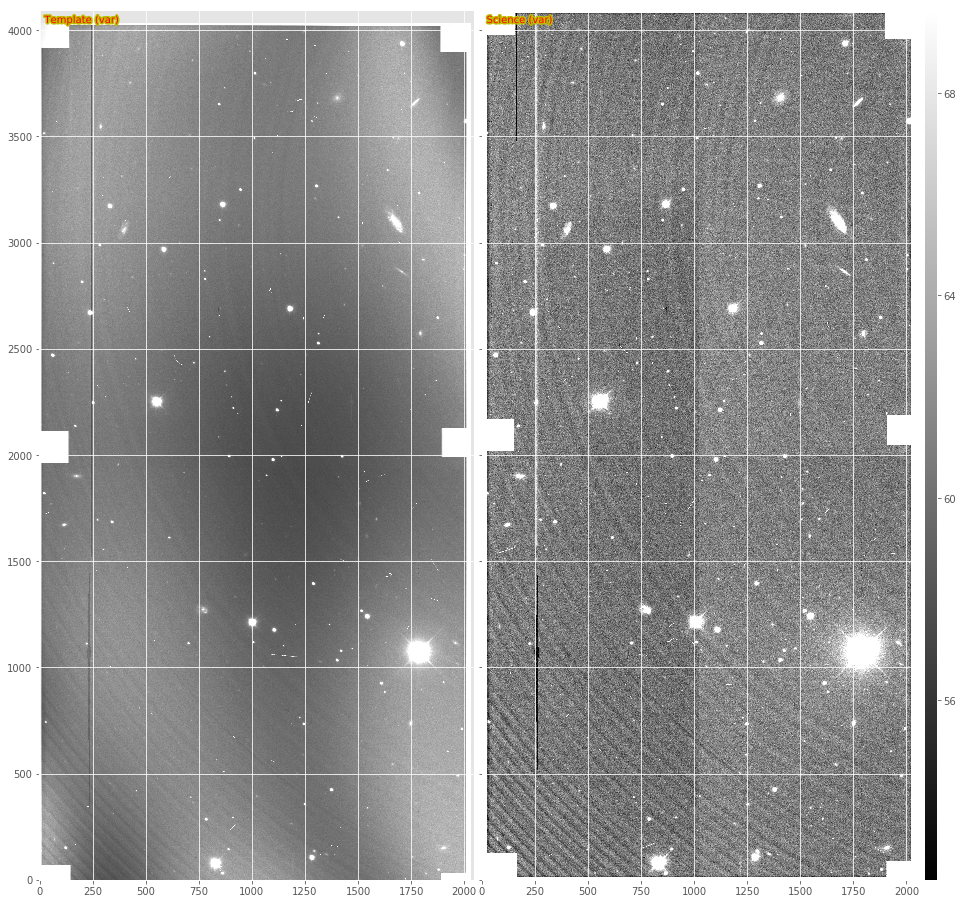

In [53]:
dit.plotImageGrid((gv(template), gv(science)), titles=['Template (var)', 'Science (var)'],
                  imScale=16)

In [81]:
config = ipDiffim.ZogyImagePsfMatchConfig()
task = ipDiffim.ZogyImagePsfMatchTask(config=config)

In [82]:
res1 = task.subtractExposures(template_unwarped, science, spatiallyVarying=False)
print "HERE1"
res2 = task.subtractExposures(template_unwarped, science, spatiallyVarying=True)
print "HERE2"

Exposure means 1: (-0.015832608331713387, -0.06497148424386978) (-0.0004804044605531587, -0.04993245750665665)
103.985311803 99.3474044493
HERE1
Exposure means 1: (-0.015832608331713387, -0.06497148424386978) (-0.0004804044605531587, -0.04993245750665665)
103.985311803 99.3474044493


/Users/dreiss/GIT_REPOS/TICKETS/DM-9989/ip_diffim/python/lsst/ip/diffim/imageMapReduce.py:284: RuntimeWarning: invalid value encountered in true_divide
  newMI.getImage().getArray()[:, :] /= wts
/Users/dreiss/GIT_REPOS/TICKETS/DM-9989/ip_diffim/python/lsst/ip/diffim/imageMapReduce.py:285: RuntimeWarning: invalid value encountered in true_divide
  newMI.getVariance().getArray()[:, :] /= wts


HERE2


In [56]:
meta = science.getMetadata()
meta.getOrderedNames()
print meta.get(u'BGMEAN')
print template_unwarped.getMetadata().get(u'BGMEAN')

99.3474044493
103.985311803


In [57]:
alDiffim = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/diffim_15A38_g/deepDiff/v411033/diffexp-03.fits')

stats(mean=-0.10714943, stdev=7.0545411, min=-9358.5557, max=33632.605)
stats(mean=-0.025264539, stdev=7.0736456, min=-9401.04, max=32240.852)
stats(mean=-0.25267488, stdev=7.5227709, min=-8829.3809, max=32037.512)
stats(mean=110.82829, stdev=5.9135437, min=-141.63298, max=15802.479)
stats(mean=110.8847, stdev=6.0002131, min=-226.78059, max=15774.525)


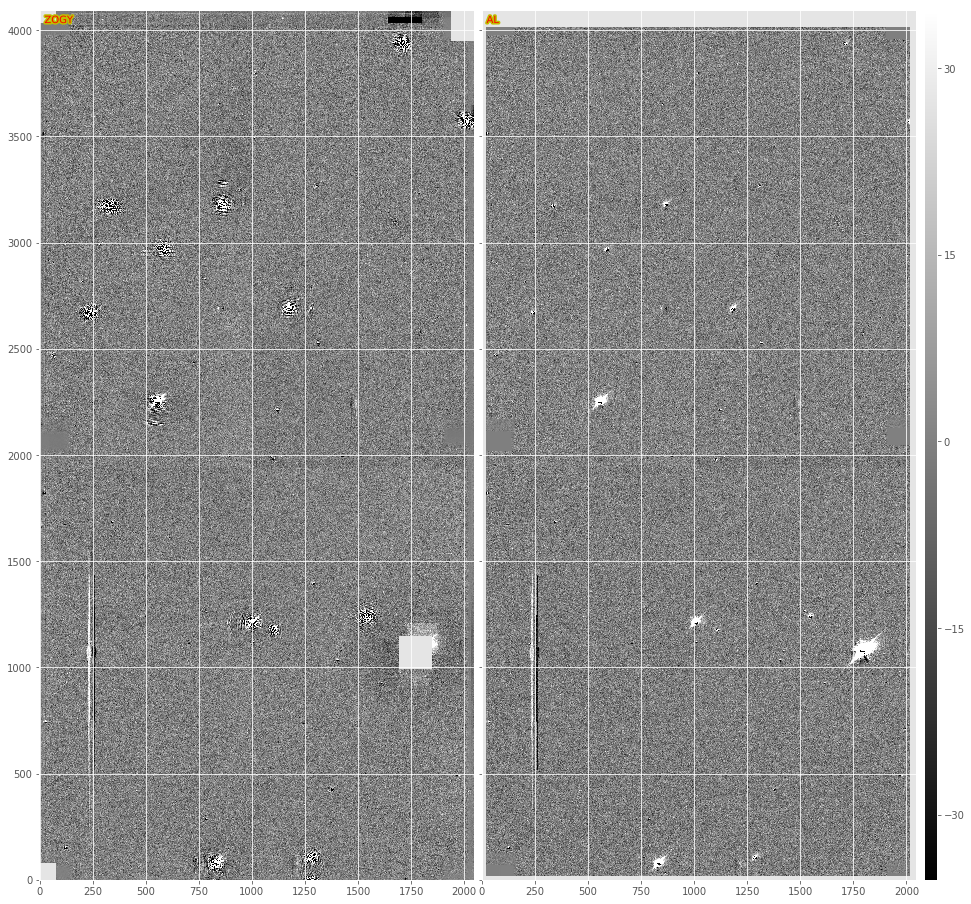

In [83]:
D1 = res1.subtractedExposure
D2 = res2.subtractedExposure
print dit.computeClippedImageStats(ga(D1))
print dit.computeClippedImageStats(ga(D2))
print dit.computeClippedImageStats(ga(alDiffim))
print dit.computeClippedImageStats(gv(D1))
print dit.computeClippedImageStats(gv(D2))
dit.plotImageGrid((ga(D2), ga(alDiffim)), imScale=16, titles=['ZOGY', 'AL'])  # gv(D)

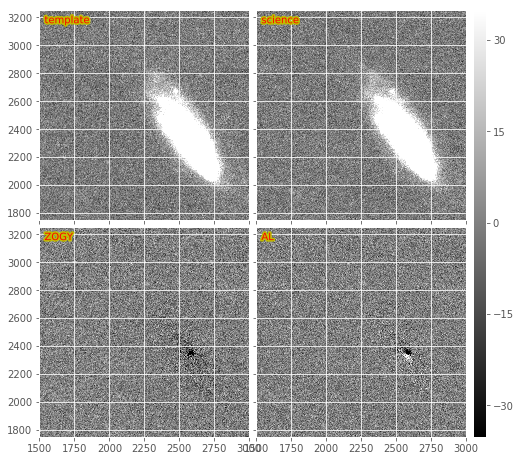

In [86]:
dit.plotImageGrid((ga(template)[3000:3250, 1500:1750], ga(science)[3000:3250, 1500:1750], 
                   ga(D1)[3000:3250, 1500:1750], ga(alDiffim)[3000:3250, 1500:1750]), imScale=4, 
                  extent=(1500, 3000, 1750, 3250),
                 titles=['template', 'science', 'ZOGY', 'AL'])  # gv(D)

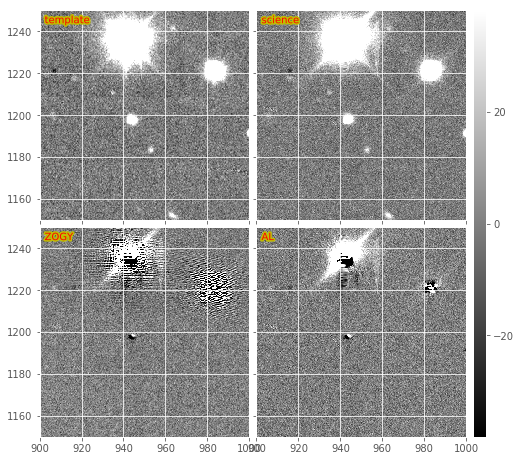

In [87]:
dit.plotImageGrid((ga(template)[1000:1250, 900:1150], ga(science)[1000:1250, 900:1150], 
                   ga(D1)[1000:1250, 900:1150], ga(alDiffim)[1000:1250, 900:1150]), imScale=4, 
                  extent=(900, 1000, 1150, 1250),
                 titles=['template', 'science', 'ZOGY', 'AL'])  # gv(D)

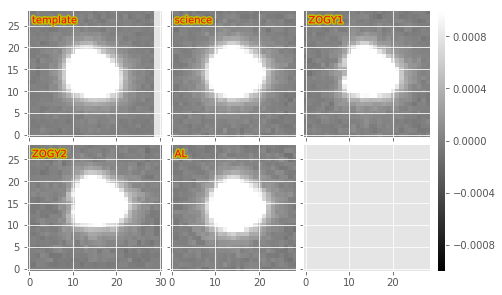

In [88]:
dit.plotImageGrid((
    template_unwarped.getPsf().computeKernelImage().getArray(),
    science.getPsf().computeKernelImage().getArray(),
    D1.getPsf().computeKernelImage(position=afwGeom.Point2D(500,500)).getArray(), 
    D2.getPsf().computeKernelImage(position=afwGeom.Point2D(500,500)).getArray(), 
    alDiffim.getPsf().computeKernelImage().getArray()),
    titles=['template', 'science', 'ZOGY1', 'ZOGY2', 'AL'], clim=(-0.001,0.001), imScale=2.5)

In [67]:
S = task.subtractExposures(template_unwarped, science, spatiallyVarying=False, doPreConvolve=True)

IndexError: index 0 is out of bounds for axis 0 with size 0

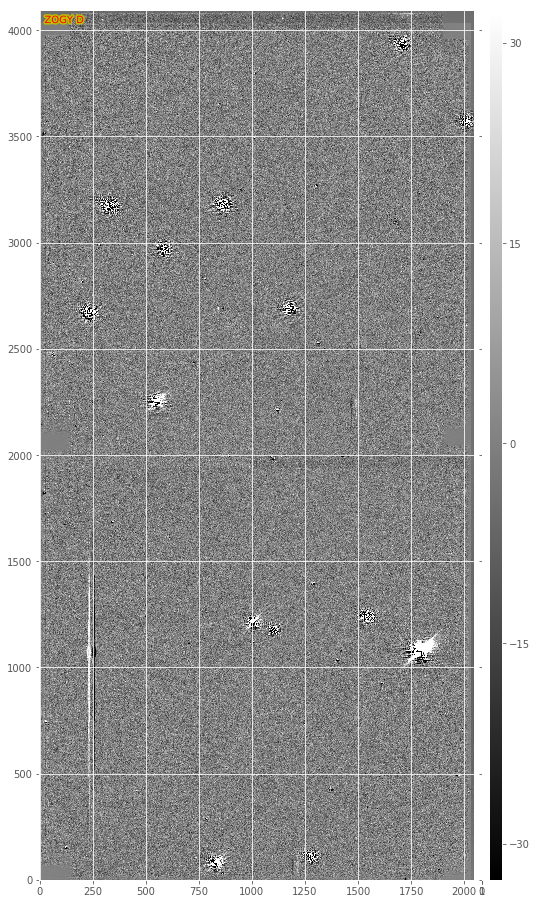

In [68]:
dit.plotImageGrid((ga(D1), ga(S.subtractedExposure)), imScale=16, titles=['ZOGY D', 'ZOGY Scorr'])  # gv(D)

In [90]:
res3 = task.subtractExposures(template_unwarped, science, inImageSpace=True, spatiallyVarying=True)
D3 = res3.subtractedExposure

Exposure means 1: (-0.015832608331713387, -0.06497148424386978) (-0.0004804044605531587, -0.04993245750665665)
103.985311803 99.3474044493


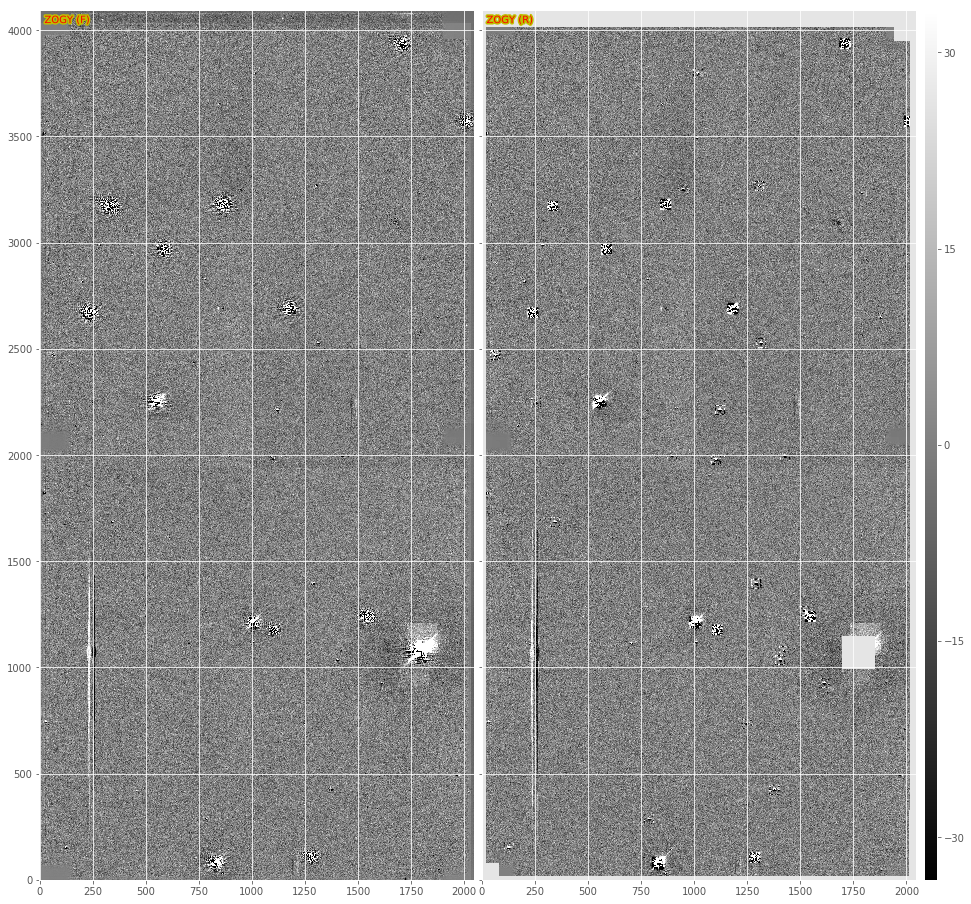

In [91]:
dit.plotImageGrid((ga(D1), ga(D3)), imScale=16, titles=['ZOGY (F)', 'ZOGY (R)'])  # gv(D)

New - I added Zogy to imageDifference.py as a config option `subtractAlgorithm='ZOGY'` in ticket branch `DM-9989` (for `ip_diffim` and `pipe_tasks`).

In [92]:
zogyDiffim = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/diffim_15A38_ZOGY_g/deepDiff/v411033/diffexp-03.fits')
zogyDiffim2 = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/diffim_15A38_ZOGYspatial_g/deepDiff/v411033/diffexp-03.fits')

In [93]:
print dit.computeClippedImageStats(ga(D1))
print dit.computeClippedImageStats(ga(zogyDiffim))
print dit.computeClippedImageStats(ga(zogyDiffim2))
print dit.computeClippedImageStats(ga(alDiffim))
print ''
print dit.computeClippedImageStats(gv(D1))
print dit.computeClippedImageStats(gv(zogyDiffim))
print dit.computeClippedImageStats(gv(zogyDiffim2))
print dit.computeClippedImageStats(gv(alDiffim))

stats(mean=-0.10714943, stdev=7.0545411, min=-9358.5557, max=33632.605)
stats(mean=-0.089197151, stdev=7.0352731, min=-9354.8975, max=33633.027)
stats(mean=0.0044439775, stdev=7.0515056, min=-9397.3633, max=32241.303)
stats(mean=-0.25267488, stdev=7.5227709, min=-8829.3809, max=32037.512)

stats(mean=110.82829, stdev=5.9135437, min=-141.63298, max=15802.479)
stats(mean=110.82829, stdev=5.9135437, min=-141.63298, max=15802.479)
stats(mean=110.8847, stdev=6.0002131, min=-226.78059, max=15774.525)
stats(mean=126.57426, stdev=4.1380782, min=91.076042, max=19275.936)


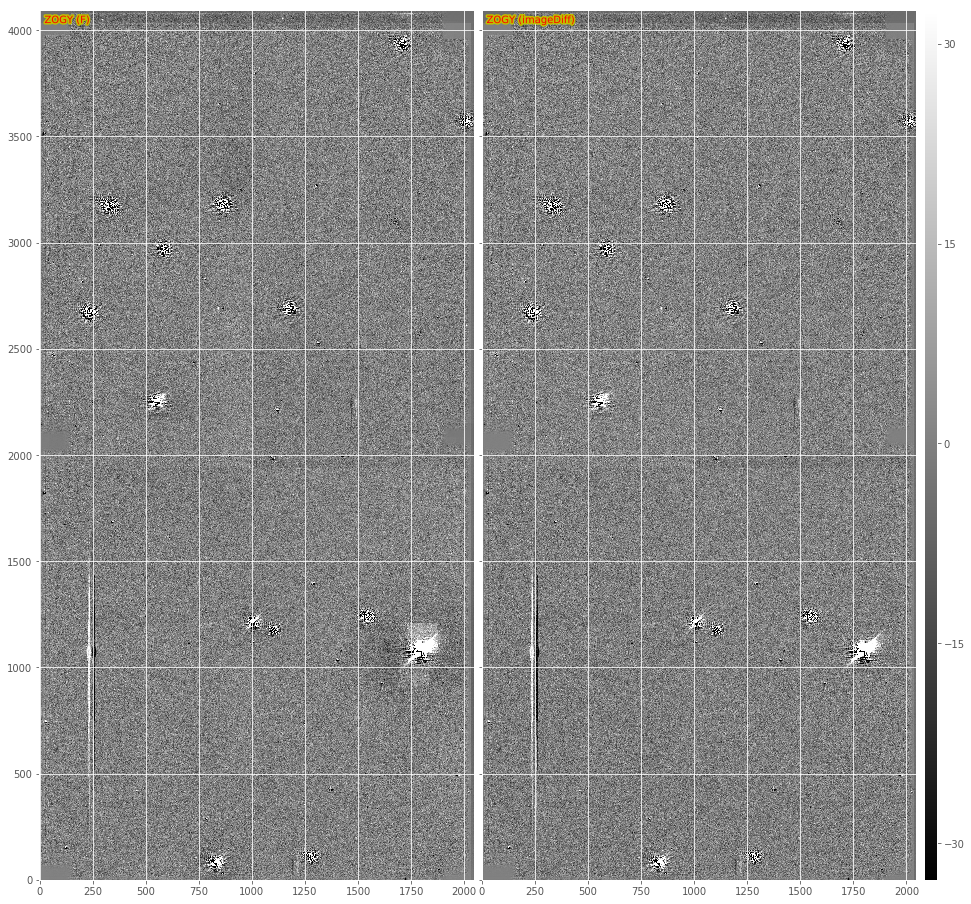

In [94]:
dit.plotImageGrid((ga(D1), ga(zogyDiffim)), imScale=16, titles=['ZOGY (F)', 'ZOGY (imageDiff)'])  # gv(D)

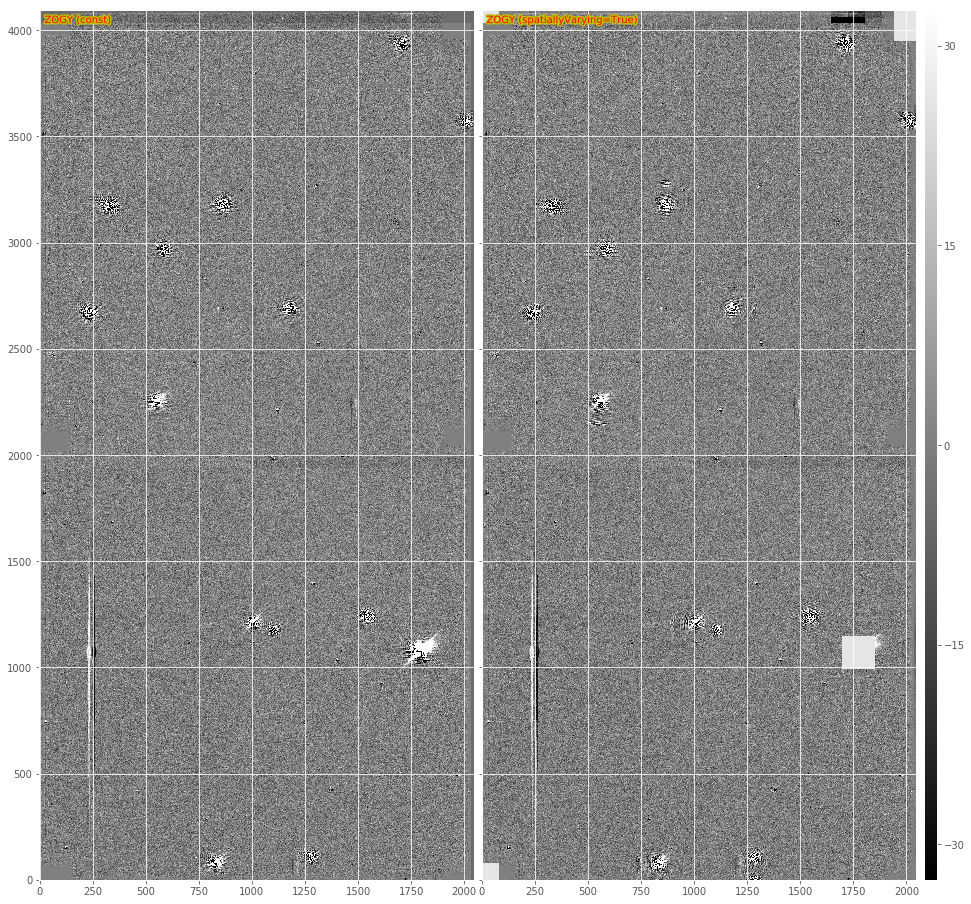

In [95]:
dit.plotImageGrid((ga(zogyDiffim), ga(zogyDiffim2)), imScale=16, titles=['ZOGY (const)', 'ZOGY (spatiallyVarying=True)'])  # gv(D)

In [47]:
psf = zogyDiffim2.getPsf()
#print psf.computeKernelImage(position=afwGeom.Point2D(500,500)).getArray()
shape = psf.computeShape(position=afwGeom.Point2D(500,500))
print shape
#psf.computeImage().getArray()

(ixx=3.99847592292, iyy=2.76990132525, ixy=-0.320253213013)


In [51]:
import lsst.pipe.base as pipeBase
x = pipeBase.Struct(x=1, y=2)
d = x.getDict()
d.has_key('x')
print x

Struct(y=2; x=1)


In [68]:
arr = zogyDiffim2.getMaskedImage().getImage().getArray()[70:80,70:80]
#print arr
arr2 = np.fft.fft2(arr)
#print arr2

### Need to copy masks from both images and or them - propagate to diffim

In [129]:
# dont bother with CCD 1, the template doesn't have a PSF.
template = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/WARPEDTEMPLATE.fits')
template_unwarped = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/processed_15A38/0410927/calexp/calexp-0410927_03.fits')
science = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/processed_15A38/0411033/calexp/calexp-0411033_03.fits')
zogyDiffim = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/diffim_15A38_ZOGY_g/deepDiff/v411033/diffexp-03.fits')
zogyDiffim2 = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/diffim_15A38_ZOGYspatial_g/deepDiff/v411033/diffexp-03.fits')

#template = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/WARPEDTEMPLATE.fits')
#science = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/processed_15A38/0411033/calexp/calexp-0411033_01.fits')
#zogyDiffim = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/diffim_15A38_ZOGY_g/deepDiff/v411033/diffexp-01.fits')
#zogyDiffim2 = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/diffim_15A38_ZOGYspatial_g/deepDiff/v411033/diffexp-01.fits')

print dit.computeClippedImageStats(ga(template_unwarped))
print dit.computeClippedImageStats(gv(template_unwarped))
print dit.computeClippedImageStats(ga(science))
print dit.computeClippedImageStats(gv(science))

print template_unwarped.getMetadata().get(u'BGMEAN')
print science.getMetadata().get(u'BGMEAN')

print dit.computeClippedImageStats(ga(template))
print dit.computeClippedImageStats(gv(template))

stats(mean=0.17763451, stdev=5.4353433, min=-105.46145, max=36738.988)
stats(mean=62.135914, stdev=1.7246594, min=33.825768, max=9672.9736)
stats(mean=0.19061854, stdev=5.2986126, min=-132.20807, max=38917.398)
stats(mean=60.944862, stdev=1.693751, min=33.64093, max=9981.7324)
103.985311803
99.3474044493
stats(mean=103.90517, stdev=4.9951696, min=11.337639, max=36904.629)
stats(mean=49.899776, stdev=5.5475841, min=34.271389, max=8497.6777)


In [108]:
slice = np.index_exp[50:250,50:250]

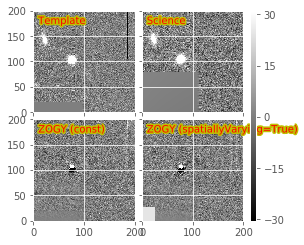

In [278]:
dit.plotImageGrid((ga(template)[slice], ga(science)[slice],
                   ga(zogyDiffim)[slice], ga(zogyDiffim2)[slice]), 
    imScale=2, titles=['Template', 'Science', 'ZOGY (const)', 'ZOGY (spatiallyVarying=True)'])

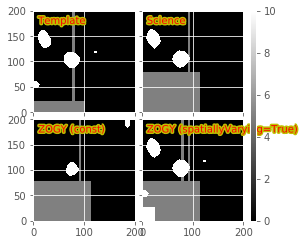

In [279]:
dit.plotImageGrid((gm(template)[slice], gm(science)[slice],
                   gm(zogyDiffim)[slice], gm(zogyDiffim2)[slice]), 
    imScale=2, titles=['Template', 'Science', 'ZOGY (const)', 'ZOGY (spatiallyVarying=True)'],
                 clim=(0,10))

{u'DETECTED_NEGATIVE': 6L, u'INTRP': 2L, u'DETECTED': 5L, u'UNMASKEDNAN': 9L, u'NO_DATA': 8L, u'BAD': 0L, u'EDGE': 4L, u'SUSPECT': 7L, u'CR': 3L, u'SAT': 1L}
{u'DETECTED_NEGATIVE': 6L, u'INTRP': 2L, u'DETECTED': 5L, u'UNMASKEDNAN': 9L, u'NO_DATA': 8L, u'BAD': 0L, u'EDGE': 4L, u'SUSPECT': 7L, u'CR': 3L, u'SAT': 1L}
<class 'lsst.afw.image.mask.mask.MaskU'>
0.0688621997833


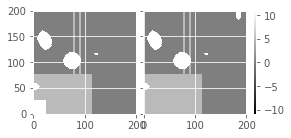

In [280]:
m = zogyDiffim.getMaskedImage().getMask().clone()
print m.getMaskPlaneDict()
print science.getMaskedImage().getMask().getMaskPlaneDict()
print type(m)
badmask = m.getPlaneBitMask(['UNMASKEDNAN', 'NO_DATA', 'BAD', 'EDGE', 'SUSPECT', 'CR', 'SAT'])
print np.mean((m.getArray() & badmask) != 0)
m |= template.getMaskedImage().getMask()
m |= science.getMaskedImage().getMask()
dit.plotImageGrid((gm(zogyDiffim2)[slice], m.getArray()[50:250,50:250],))

<class 'lsst.afw.image.mask.mask.MaskU'> True
<type 'numpy.ndarray'> True


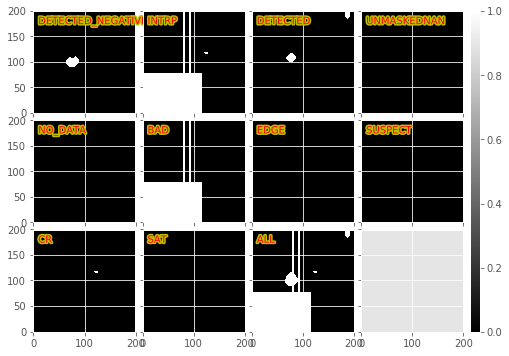

In [137]:
m = zogyDiffim.getMaskedImage().getMask().clone()
print type(m), isinstance(m, afwImage.mask.MaskU)
print type(m.getArray()), isinstance(m.getArray(), np.ndarray)
def getMask(m, names):
    badmask = m.getPlaneBitMask(names)
    return (m.getArray() & badmask) != 0
#names = ['INTRP', 'UNMASKEDNAN', 'NO_DATA', 'BAD', 'EDGE', 'SUSPECT', 'CR', 'SAT']
names = zogyDiffim.getMaskedImage().getMask().getMaskPlaneDict().keys()
mplanes = [getMask(m, [name])[slice] for name in names]
mplanes.append(getMask(m, names)[slice])
names.append('ALL')
dit.plotImageGrid((mplanes), titles=names, clim=(0,1))

<type 'numpy.ndarray'>
<type 'numpy.ndarray'>


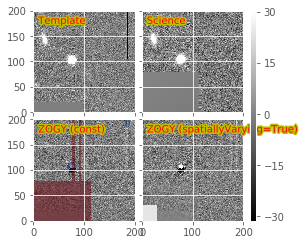

In [146]:
m = zogyDiffim.getMaskedImage().getMask().clone()
detectedMask = getMask(m, ['DETECTED'])[slice] * 1.0
badMask = getMask(m, ['BAD'])[slice] * 1.0
dit.plotImageGrid((ga(template)[slice], ga(science)[slice],
                   ga(zogyDiffim)[slice], ga(zogyDiffim2)[slice]), 
    imScale=2, titles=['Template', 'Science', 'ZOGY (const)', 'ZOGY (spatiallyVarying=True)'],
                 #masks={2: ({'mask': m, 'maskName': 'DETECTED', 'cmap': 'Blues'},
                 #           {'mask': m, 'maskName': 'BAD',      'cmap': 'Reds'})})
                 masks={2: ({'mask': detectedMask, 'cmap': 'Blues'},
                            {'mask': badMask, 'cmap': 'Reds'})})

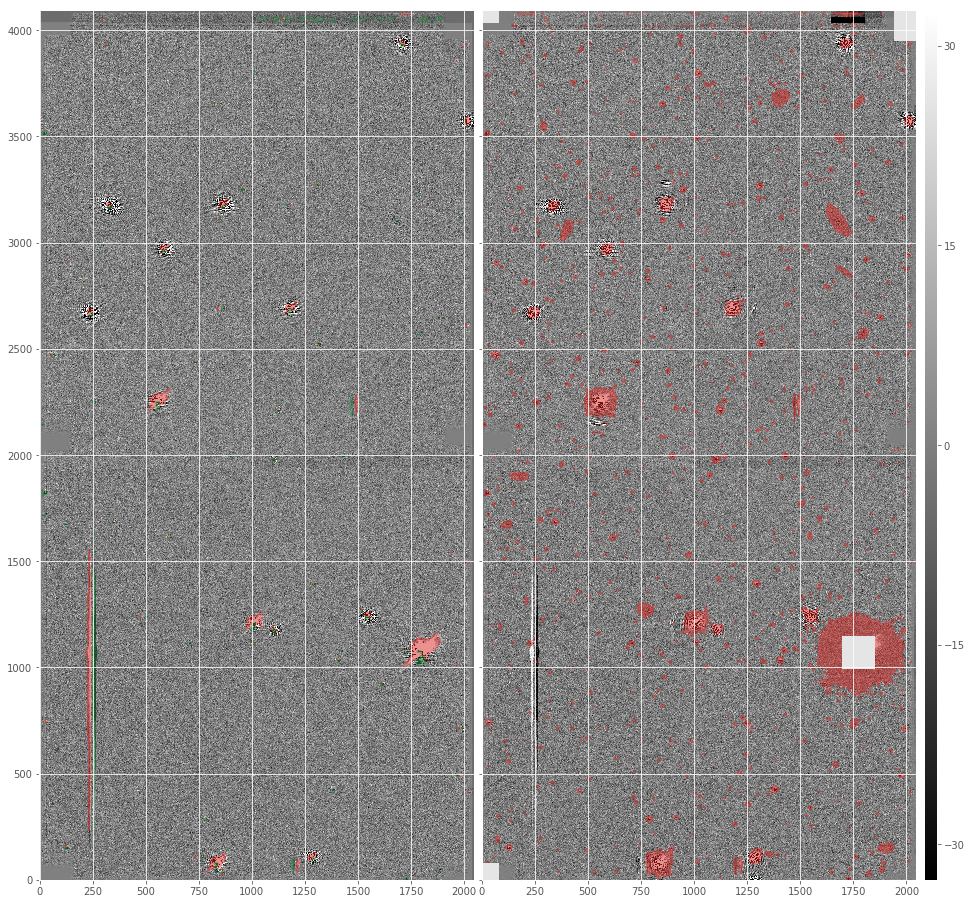

In [157]:
dit.plotImageGrid((zogyDiffim, zogyDiffim2), imScale=16,
                 masks={0:({'maskName': 'DETECTED', 'cmap': 'Reds'}, 
                           {'maskName': 'DETECTED_NEGATIVE', 'cmap': 'Greens'}),
                        1:({'maskName': 'DETECTED', 'cmap': 'Reds'}, 
                           {'maskName': 'DETECTED_NEGATIVE', 'cmap': 'Greens'})})

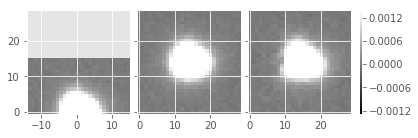

In [282]:
dit.plotImageGrid((template.getPsf().computeKernelImage(),
                  science.getPsf().computeKernelImage(),
                  zogyDiffim.getPsf().computeKernelImage(),
                  #zogyDiffim2.getPsf().computeKernelImage()
                  ))

stats(mean=-0.71438557, stdev=7.1879659, min=-1343.4799, max=1014.5602)
stats(mean=0.13103008, stdev=7.2101846, min=-1422.9694, max=982.55487)
stats(mean=-0.96267951, stdev=7.7953544, min=-1337.647, max=1226.884)
stats(mean=104.31851, stdev=4.8922276, min=67.209084, max=4688.0811)
103.906
stats(mean=0.058358032, stdev=5.4182014, min=-21.01158, max=3793.6296)

stats(mean=110.08629, stdev=5.0533943, min=96.416687, max=1854.745)
stats(mean=110.08578, stdev=5.0866275, min=93.499382, max=1867.1227)
stats(mean=130.77203, stdev=4.4010811, min=114.71942, max=2146.0974)
stats(mean=49.457806, stdev=4.4078269, min=38.16547, max=1020.4678)
stats(mean=60.676975, stdev=2.0268271, min=52.604069, max=1048.8108)


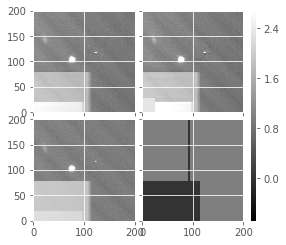

In [283]:
m = zogyDiffim.getMaskedImage().getMask().clone()
names = ['INTRP', 'UNMASKEDNAN', 'NO_DATA', 'BAD', 'EDGE', 'SUSPECT', 'CR', 'SAT']
badMask = getMask(m, names)[slice]
badMask2 = getMask(m, names)

print dit.computeClippedImageStats(ga(zogyDiffim)[slice][badMask == 0])
print dit.computeClippedImageStats(ga(zogyDiffim2)[slice][badMask == 0])
print dit.computeClippedImageStats(ga(alDiffim)[slice][badMask == 0])
print dit.computeClippedImageStats(ga(template)[slice][badMask == 0])
print np.median(ga(template)[~np.isnan(ga(template)) & (badMask2 == 0)])
print dit.computeClippedImageStats(ga(science)[slice][badMask == 0])
print
print dit.computeClippedImageStats(gv(zogyDiffim)[slice][badMask == 0])
print dit.computeClippedImageStats(gv(zogyDiffim2)[slice][badMask == 0])
print dit.computeClippedImageStats(gv(alDiffim)[slice][badMask == 0])
print dit.computeClippedImageStats(gv(template)[slice][badMask == 0])
print dit.computeClippedImageStats(gv(science)[slice][badMask == 0])

dit.plotImageGrid((gv(zogyDiffim)[slice], gv(zogyDiffim2)[slice],
                  gv(alDiffim)[slice], badMask == 0))

Let's just confirm that the A&L decorrelation (spatial) task works too...

stats(mean=-0.25267488, stdev=7.5227709, min=-8829.3809, max=32037.512)
stats(mean=-0.25815654, stdev=7.5176001, min=-8853.8457, max=32540.07)
stats(mean=126.57426, stdev=4.1380782, min=91.076042, max=19275.936)
stats(mean=126.65665, stdev=4.7963343, min=90.102509, max=19520.059)


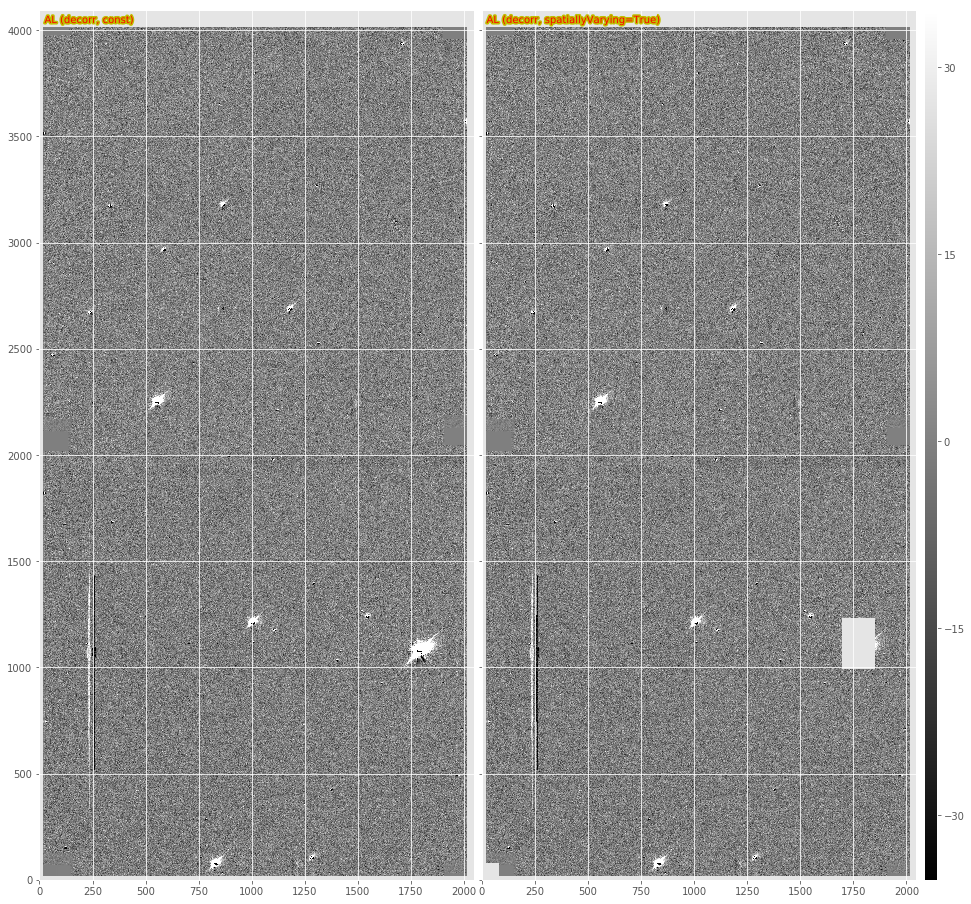

In [105]:
diffimALdecorr = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/diffim_15A38_newDecorr_g/deepDiff/v411033/diffexp-03.fits')
diffimALdecorrSpatial = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/diffim_15A38_newDecorrSpatial_g/deepDiff/v411033/diffexp-03.fits')
gm(diffimALdecorr)[:, :] = gm(diffimALdecorrSpatial)

print dit.computeClippedImageStats(ga(diffimALdecorr))
print dit.computeClippedImageStats(ga(diffimALdecorrSpatial))
print dit.computeClippedImageStats(gv(diffimALdecorr))
print dit.computeClippedImageStats(gv(diffimALdecorrSpatial))

dit.plotImageGrid((diffimALdecorr, diffimALdecorrSpatial), 
                  imScale=16, titles=['AL (decorr, const)', 'AL (decorr, spatiallyVarying=True)'])  # gv(D)